# imports

import os
import glob
from dotenv import load_dotenv
import gradio as gr

In [91]:
from langchain.document_loaders import DirectoryLoader, TextLoader
from langchain.text_splitter import CharacterTextSplitter
from langchain.schema import Document
from langchain_openai import OpenAIEmbeddings, ChatOpenAI
from langchain_chroma import Chroma
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import numpy as np
import plotly.graph_objects as go
from langchain.memory import ConversationBufferMemory
from langchain.chains import ConversationalRetrievalChain
from langchain.embeddings import HuggingFaceEmbeddings

In [92]:
MODEL = "gpt-4o-mini"
db_name = "vector_db"

In [93]:
load_dotenv(override=True)
os.environ['OPENAI_API_KEY'] = os.getenv('OPENAI_API_KEY')

In [94]:
folders = glob.glob("knowledge-base/*")

def add_metadata(doc, doc_type):
    doc.metadata["doc_type"] = doc_type
    return doc

text_loader_kwargs = {'encoding': 'utf-8'}


documents = []
for folder in folders:
    doc_type = os.path.basename(folder)
    loader = DirectoryLoader(folder, glob="**/*.md", loader_cls=TextLoader, loader_kwargs=text_loader_kwargs)
    folder_docs = loader.load()
    documents.extend([add_metadata(doc, doc_type) for doc in folder_docs])

text_splitter = CharacterTextSplitter(chunk_size=1000, chunk_overlap=200)
chunks = text_splitter.split_documents(documents)

print(f"Total number of chunks: {len(chunks)}")
print(f"Document types found: {set(doc.metadata['doc_type'] for doc in documents)}")

Created a chunk of size 1493, which is longer than the specified 1000
Created a chunk of size 1031, which is longer than the specified 1000
Created a chunk of size 1255, which is longer than the specified 1000
Created a chunk of size 1277, which is longer than the specified 1000
Created a chunk of size 1160, which is longer than the specified 1000


Total number of chunks: 79
Document types found: {'currency-exchange-and-budgeting', 'safety-and-emergency-information', 'flight-information', 'hotel-information', 'travel-insurance', 'visa-and-travel-documentation', 'local-transport-and-rentals', 'travel-packages-and-itineraries'}


In [95]:
embeddings = OpenAIEmbeddings()

# Delete if already exists

if os.path.exists(db_name):
    Chroma(persist_directory=db_name, embedding_function=embeddings).delete_collection()

# Create vectorstore

vectorstore = Chroma.from_documents(documents=chunks, embedding=embeddings, persist_directory=db_name)
print(f"Vectorstore created with {vectorstore._collection.count()} documents")

Vectorstore created with 79 documents


In [96]:
collection = vectorstore._collection
count = collection.count()

sample_embedding = collection.get(limit=1, include=["embeddings"])["embeddings"][0]
dimensions = len(sample_embedding)
print(f"There are {count:,} vectors with {dimensions:,} dimensions in the vector store")

There are 79 vectors with 1,536 dimensions in the vector store


## Visualizing the Vector Store


In [97]:
result = collection.get(include=['embeddings', 'documents', 'metadatas'])
vectors = np.array(result['embeddings'])
documents = result['documents']
metadatas = result['metadatas']
doc_types = [metadata['doc_type'] for metadata in metadatas]
colors = [['blue', 'green', 'red', 'orange', 'yellow', 'violet', 'grey', 'black'][['currency-exchange-and-budgeting', 'flight-information', 'hotel-information', 'local-transport-and-rentals', 'safety-and-emergency-information', 'travel-insurance', 'travel-packages-and-itineraries', 'visa-and-travel-documentation'].index(t)] for t in doc_types]

In [98]:
# We humans find it easier to visalize things in 2D!
# Reduce the dimensionality of the vectors to 2D using t-SNE
# (t-distributed stochastic neighbor embedding)

tsne = TSNE(n_components=2, random_state=42)
reduced_vectors = tsne.fit_transform(vectors)

# Create the 2D scatter plot
fig = go.Figure(data=[go.Scatter(
    x=reduced_vectors[:, 0],
    y=reduced_vectors[:, 1],
    mode='markers',
    marker=dict(size=5, color=colors, opacity=0.8),
    text=[f"Type: {t}<br>Text: {d[:100]}..." for t, d in zip(doc_types, documents)],
    hoverinfo='text'
)])

fig.update_layout(
    title='2D Chroma Vector Store Visualization',
    scene=dict(xaxis_title='x',yaxis_title='y'),
    width=800,
    height=600,
    margin=dict(r=20, b=10, l=10, t=40)
)

fig.show()

In [99]:
# Let's try 3D!

tsne = TSNE(n_components=3, random_state=42)
reduced_vectors = tsne.fit_transform(vectors)

# Create the 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(
    x=reduced_vectors[:, 0],
    y=reduced_vectors[:, 1],
    z=reduced_vectors[:, 2],
    mode='markers',
    marker=dict(size=5, color=colors, opacity=0.8),
    text=[f"Type: {t}<br>Text: {d[:100]}..." for t, d in zip(doc_types, documents)],
    hoverinfo='text'
)])

fig.update_layout(
    title='3D Chroma Vector Store Visualization',
    scene=dict(xaxis_title='x', yaxis_title='y', zaxis_title='z'),
    width=900,
    height=700,
    margin=dict(r=20, b=10, l=10, t=40)
)

fig.show()

## Using LangChain to bring it all together

In [100]:
llm = ChatOpenAI(temperature=0.7, model_name=MODEL)

# llm = ChatOpenAI(temperature=0.7, model_name='llama3.2', base_url='http://localhost:11434/v1', api_key='ollama')

memory = ConversationBufferMemory(memory_key='chat_history', return_messages=True)

retriever = vectorstore.as_retriever()

conversation_chain = ConversationalRetrievalChain.from_llm(llm=llm, retriever=retriever, memory=memory)

In [101]:
# Question

query = "what are the types of travel insurance "
result = conversation_chain.invoke({"question": query})
print(result["answer"])

The types of travel insurance include:

1. **Single-Trip Insurance**: Covers one specific trip, best for occasional travelers.
2. **Multi-Trip Insurance**: Covers multiple trips within a specific time (usually a year), ideal for frequent travelers.
3. **Medical Travel Insurance**: Provides coverage for medical emergencies, hospitalization, and treatment, suitable for all travelers.
4. **Trip Cancellation Insurance**: Refunds non-refundable expenses if a trip is canceled for covered reasons, best for travelers with expensive plans.
5. **Baggage and Personal Items Insurance**: Offers compensation for lost, stolen, or damaged baggage, ideal for long-haul travelers.
6. **Adventure Sports Insurance**: Covers injuries from high-risk activities like skiing, diving, or hiking, suitable for adventure seekers.
7. **Rental Car Insurance**: Provides collision and liability coverage for rental cars, ideal for road trippers.


In [102]:
memory = ConversationBufferMemory(memory_key='chat_history', return_messages=True)
conversation_chain = ConversationalRetrievalChain.from_llm(llm=llm, retriever=retriever, memory=memory)

## Using Gradio for UI -


In [103]:
def chat(question, history):
    result = conversation_chain.invoke({"question": question})
    return result["answer"]

In [104]:
# And in Gradio:

view = gr.ChatInterface(chat, type="messages").launch(inbrowser=True)

* Running on local URL:  http://127.0.0.1:7881

To create a public link, set `share=True` in `launch()`.


In [105]:
# investigate what gets sent behind the scenes

from langchain_core.callbacks import StdOutCallbackHandler

llm = ChatOpenAI(temperature=0.7, model_name=MODEL)

memory = ConversationBufferMemory(memory_key='chat_history', return_messages=True)

retriever = vectorstore.as_retriever()

conversation_chain = ConversationalRetrievalChain.from_llm(llm=llm, retriever=retriever, memory=memory, callbacks=[StdOutCallbackHandler()])

query = "how much days it will take for hotel refund for bank transfer?"
result = conversation_chain.invoke({"question": query})
answer = result["answer"]
print("\nAnswer:", answer)



> Entering new ConversationalRetrievalChain chain...


> Entering new StuffDocumentsChain chain...


> Entering new LLMChain chain...
Prompt after formatting:
System: Use the following pieces of context to answer the user's question. 
If you don't know the answer, just say that you don't know, don't try to make up an answer.
----------------
---
### **2.6 Hotel_Refund_Policies.md**
---

#### **Introduction**

Refund policies vary based on booking platforms, hotel rules, and the reason for cancellation.

---

#### **Refund Processing Time**

| **Payment Method** | **Refund Time**    |
| ------------------ | ------------------ |
| Credit/Debit Card  | 5-10 Business Days |
| Bank Transfer      | 7-14 Business Days |
| Digital Wallet     | 1-3 Business Days  |

---

#### **Eligible Scenarios for Refunds**

- Cancellation within the free cancellation window.
- Natural disasters or emergencies.
- Hotel overbooking.

---

#### **Non-Eligible Scenarios**

- Late cancellations beyond the dead

In [115]:

llm = ChatOpenAI(temperature=0.7, model_name=MODEL)

memory = ConversationBufferMemory(memory_key='chat_history', return_messages=True)

retriever = vectorstore.as_retriever(search_kwargs={"k": 25})

conversation_chain = ConversationalRetrievalChain.from_llm(llm=llm, retriever=retriever, memory=memory)


In [116]:
# from langchain.prompts import PromptTemplate

# custom_prompt = PromptTemplate.from_template(
#     """
#     You are a friendly and helpful travel assistant. 
#     You can remember the user's name and respond to personal introductions. 
#     Answer questions based on the knowledge base and maintain conversational memory.
#     Provide relevant and clear answers.

#     Chat History:
#     {chat_history}

#     User: {question}
#     Assistant:
#     """
# )

# conversation_chain = ConversationalRetrievalChain.from_llm(
#     llm=llm,
#     retriever=retriever,
#     memory=memory,
#     condense_question_prompt=custom_prompt
# )


In [117]:
def chat(question, history):
    result = conversation_chain.invoke({"question": question})
    return result["answer"]

In [118]:
view = gr.ChatInterface(chat, type="messages").launch(inbrowser=True)

* Running on local URL:  http://127.0.0.1:7885

To create a public link, set `share=True` in `launch()`.


In [57]:
import base64
from io import BytesIO
from PIL import Image

In [58]:
def artist(city):
    image_response = openai.images.generate(
            model="dall-e-3",
            prompt=f"An image representing a vacation in {city}, showing tourist spots and everything unique about {city}, in a vibrant pop-art style",
            size="1024x1024",
            n=1,
            response_format="b64_json",
        )
    image_base64 = image_response.data[0].b64_json
    image_data = base64.b64decode(image_base64)
    return Image.open(BytesIO(image_data))

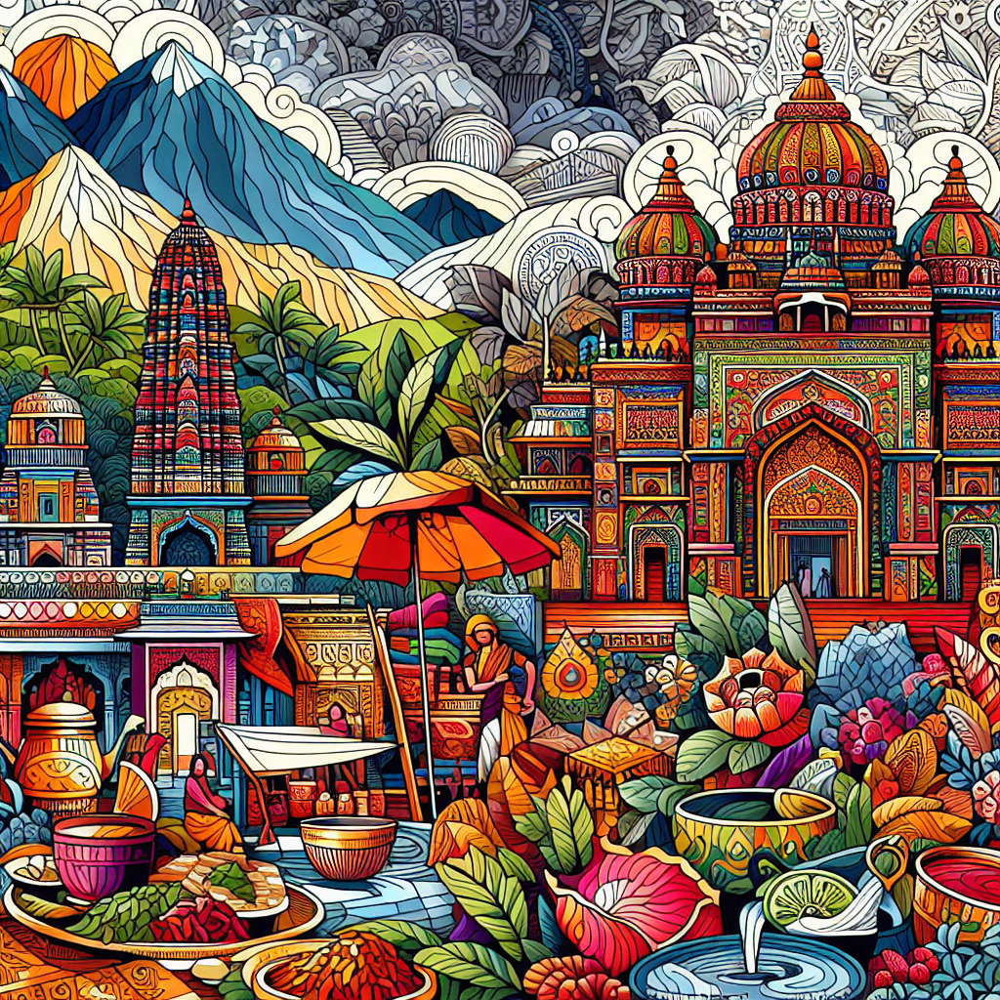

In [59]:
image = artist("india")
display(image)

In [60]:
import base64
from io import BytesIO
from PIL import Image
from IPython.display import Audio, display

def talker(message):
    response = openai.audio.speech.create(
        model="tts-1",
        voice="onyx",
        input=message)

    audio_stream = BytesIO(response.content)
    output_filename = "output_audio.mp3"
    with open(output_filename, "wb") as f:
        f.write(audio_stream.read())

    # Play the generated audio
    display(Audio(output_filename, autoplay=True))

talker("Well, hi madhan how are you. its been so long we met each other. nice to meet you..")

In [121]:
import os
import glob
import gradio as gr
from langchain.document_loaders import DirectoryLoader, TextLoader
from langchain.text_splitter import CharacterTextSplitter
from langchain.schema import Document
from langchain_chroma import Chroma
from langchain.memory import ConversationBufferMemory
from langchain.chains import ConversationalRetrievalChain
from langchain.embeddings import HuggingFaceEmbeddings
from langchain.llms import Ollama

MODEL = "llama3.2"
DB_NAME = "vector_db"
EMBEDDING_MODEL = "sentence-transformers/all-MiniLM-L6-v2"
OLLAMA_BASE_URL = "http://localhost:11434"

folders = glob.glob("knowledge-base/*")

def add_metadata(doc, doc_type):
    doc.metadata["doc_type"] = doc_type
    return doc

text_loader_kwargs = {'encoding': 'utf-8'}

documents = []
for folder in folders:
    doc_type = os.path.basename(folder)
    loader = DirectoryLoader(folder, glob="**/*.md", loader_cls=TextLoader, loader_kwargs=text_loader_kwargs)
    folder_docs = loader.load()
    documents.extend([add_metadata(doc, doc_type) for doc in folder_docs])

text_splitter = CharacterTextSplitter(chunk_size=1000, chunk_overlap=200)
chunks = text_splitter.split_documents(documents)

embeddings = HuggingFaceEmbeddings(model_name=EMBEDDING_MODEL)

if os.path.exists(DB_NAME):
    Chroma(persist_directory=DB_NAME, embedding_function=embeddings).delete_collection()

vectorstore = Chroma.from_documents(documents=chunks, embedding=embeddings, persist_directory=DB_NAME)

collection = vectorstore._collection
count = collection.count()

llm = Ollama(model=MODEL, base_url=OLLAMA_BASE_URL)

memory = ConversationBufferMemory(memory_key='chat_history', return_messages=True)

retriever = vectorstore.as_retriever()

conversation_chain = ConversationalRetrievalChain.from_llm(llm=llm, retriever=retriever, memory=memory)

def chat(question, history):
    result = conversation_chain.invoke({"question": question})
    return result["answer"]

view = gr.ChatInterface(chat, type="messages").launch(inbrowser=True)


Created a chunk of size 1493, which is longer than the specified 1000
Created a chunk of size 1031, which is longer than the specified 1000
Created a chunk of size 1255, which is longer than the specified 1000
Created a chunk of size 1277, which is longer than the specified 1000
Created a chunk of size 1160, which is longer than the specified 1000


* Running on local URL:  http://127.0.0.1:7919

To create a public link, set `share=True` in `launch()`.
